In [22]:
# from regelum.scenario import Scenario
from regelum.simulator import CasADi
import numpy as np

from regelum.utils import rg
from regelum.model import ModelWeightContainer
# Max Iteration count may be added in opt_options={"print_level": 0, "max_iter": MAX_ITER},
from regelum.optimizable.core.configs import CasadiOptimizerConfig
from regelum.predictor import EulerPredictor
from regelum.objective import RunningObjective
from regelum.critic import CriticTrivial
from regelum.scenario import RLScenario
from regelum.event import Event

import sys
sys.path.append('../')

from src.system import HydraulicSystem, StationaryHydraulicSystem
from src.observer import StationaryHydraulicObserver
from src.objective import HydraulicObjectiveModel
from src.policy import MPC
from src.animation_ru import HydraylicAnimation

In [23]:
from regelum.callback import (
    ScenarioStepLogger,
    # StateTracker,
    # HistoricalDataCallback,
)
from src.callback import HistoricalDataCallback, SimulatorStepLogger

from regelum import set_ipython_env
%matplotlib inline
callbacks = [SimulatorStepLogger, ScenarioStepLogger, HistoricalDataCallback]
ScenarioStepLogger.cooldown = 0.01
callbacks = set_ipython_env(callbacks=callbacks, interactive=True)

In [24]:
MAX_STEP = 1e-7
PREDICTION_HORIZON = 5
FINAL_TIME = 10e-3
SAMPLING_TIME = 1e-3
ACTION_SIZE = 1

pred_step_size = 1 * SAMPLING_TIME

# Define the initial state
p_atm = 1e5
initial_state = rg.array([1e3, 0, 0, p_atm, p_atm])

model = ModelWeightContainer(
    dim_output=ACTION_SIZE, 
    weights_init=rg.zeros((PREDICTION_HORIZON + 1, ACTION_SIZE), rc_type=rg.CASADI)
)  # A trivial model contains our predicted actions

# system = HydraulicSystem(
#     init_state=initial_state
# )

# # Update observation noize std
# system.update_system_parameters(
#     {
#         "jet_length_std": 2e-1, # Was 10e-2
#         "jet_velocity_std": 1e-1, # Was 2e-2
#     }
# )

system = HydraulicSystem(
    init_state=initial_state,
    system_parameters_init = {
            "p_l_gauge": 1.5e5,
            "x_th_limits": (0., 20.),
            "freq_th": 500.0,
            "m_p": 20e-3,
            "D_th": 200e-6, # WAS 200e-6, then 5e-3
            "D_hydr": 20e-3,
            "D_work": 20e-3,
            "h_work_init": 1e3,
            "D_exit": 0.33e-3,
            "l_exit": 8.5e-3,
            "p_coulomb": 10e3, # WAS 10e3, then 1e3
            "eta": 0.70,
            "zeta_th": 5.0, # WAS 5.0, then 0.1
            "rho_hydr": 1e3,
            "rho_work": 1e3,
            "beta_v_hydr": 0.49e-9,
            "beta_v_work": 0.49e-9,
            "sigma_work": 73e-3,
            "mu_work": 1.0e-3,
            "v_j": 200.,
            "jet_length_std": 1e-1, # Was 10e-2
            "jet_velocity_std": 10, # Was 2e-2
            "pressure_std": 0.,
            "p_atm": 1e5, # Atmosphere (ambient) pressure, Pa
            "g": 9.81, # gravity constant, m/s^2
        },
)


system_model = StationaryHydraulicSystem(
    init_state=initial_state
)
observer = StationaryHydraulicObserver(
    system=system_model
)
predictor = EulerPredictor(
    system=system_model, pred_step_size=pred_step_size
)  # Predictor is used for MPC-prediction

# RUNNING OBJECTIVE
running_objective_model = HydraulicObjectiveModel(
    system=system_model,
    quad_matrix_type="diagonal", weights=[1, 0, 0]
)  # A quadratic model for running (a.k.a. instant) objective
running_objective = RunningObjective(
    model=running_objective_model
)  # Wrap `running_objective_model` into `RunningObjective` class

# Update observation noize std
system.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

system_model.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

simulator = CasADi(
    system=system,
    state_init=initial_state,
    action_init=rg.array([0]),
    time_final=FINAL_TIME,
    max_step=MAX_STEP,
)

scenario = RLScenario(
    policy=MPC(
        model=model,
        system=system_model,
        action_bounds=system_model.action_bounds,
        optimizer_config=CasadiOptimizerConfig(),
        prediction_horizon=PREDICTION_HORIZON,
        running_objective=running_objective,
        predictor=predictor
    ),
    observer = observer,
    critic=CriticTrivial(),  # mocked critic
    running_objective=running_objective,
    policy_optimization_event=Event.compute_action,  # run policy optimization on each step
    discount_factor=1.0,
    sampling_time=SAMPLING_TIME,
    simulator=simulator,
    N_episodes=1,
    N_iterations=1,
)

scenario.run()

[01:20:47] INFO     runn. objective: 3.18, state est.: [1000.04    5.6     0.37], observation: [   ]8;id=426389;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=296762;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.14 20.58], action: [20.], value: 0.0032, time: 0.0000 (0.0%), episode: 1/1,                  
                    iteration: 1/1                                                                                 

[01:21:04] INFO     runn. objective: 2.84, state est.: [1000.07  121.9     8.13], observation: [   ]8;id=587460;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=828477;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.24 447.74], action: [20.], value: 0.0060, time: 0.0010 (10.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[01:21:23] INFO     runn. objective: 1.07, state est.: [1000.24  190.47   12.73], observation: [   ]8;id=594736;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=39682;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.89 699.6 ], action: [-0.54], value: 0.0071, time: 0.0020 (20.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[01:21:43] INFO     runn. objective: 0.15, state est.: [1000.42  111.48    7.44], observation: [   ]8;id=930541;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=762113;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.53 409.49], action: [-7.67], value: 0.0072, time: 0.0030 (30.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[01:22:04] INFO     runn. objective: 0.31, state est.: [1000.37   21.13    1.41], observation: [   ]8;id=812521;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=959028;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.37 77.62], action: [16.14], value: 0.0076, time: 0.0040 (40.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[01:22:28] INFO     runn. objective: 0.01, state est.: [1000.5   112.57    7.51], observation: [   ]8;id=637885;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=68682;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.84 413.5 ], action: [-10.03], value: 0.0076, time: 0.0050 (50.0%), episode:                  
                    1/1, iteration: 1/1                                                                            

[01:22:52] INFO     runn. objective: 0.01, state est.: [1000.5     5.59    0.37], observation: [   ]8;id=115917;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=204195;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.82 20.54], action: [2.65], value: 0.0076, time: 0.0060 (60.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[01:23:20] INFO     runn. objective: 0.05, state est.: [1000.58   24.94    1.66], observation: [   ]8;id=782700;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=410606;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.14 91.62], action: [-6.43], value: 0.0076, time: 0.0070 (70.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[01:23:49] INFO     runn. objective: 0.02, state est.: [1000.57   -0.49   -0.03], observation: [   ]8;id=728711;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=668200;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.08 -1.82], action: [-0.], value: 0.0076, time: 0.0080 (80.0%), episode: 1/1,                 
                    iteration: 1/1                                                                                 

[01:24:20] INFO     runn. objective: 0.01, state est.: [1000.56    5.27    0.35], observation: [   ]8;id=160263;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=566622;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.04 19.37], action: [-0.39], value: 0.0077, time: 0.0090 (90.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[01:24:54] INFO     runn. objective: 0.01, state est.: [1000.55    0.44    0.03], observation:     ]8;id=460658;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=789840;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    [2.03 1.6 ], action: [-0.27], value: 0.0077, time: 0.0100 (100.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.179971,0.003180,1,1,20.000000,0.143056,20.581434,1000.038947,5.603295,0.373554
1,0.001000,2.837861,0.006018,1,1,20.000000,0.241708,447.744584,1000.065805,121.898463,8.134423
2,0.002000,1.071521,0.007089,1,1,-0.540905,0.891160,699.599881,1000.242618,190.466068,12.727747
3,0.003000,0.154756,0.007244,1,1,-7.668140,1.532913,409.486457,1000.417335,111.482688,7.438191
4,0.004000,0.314169,0.007558,1,1,16.139487,1.365795,77.623769,1000.371838,21.133071,1.408915
5,0.005000,0.007169,0.007565,1,1,-10.034812,1.841633,413.498101,1000.501385,112.574858,7.511181
6,0.006000,0.010775,0.007576,1,1,2.649787,1.822500,20.539201,1000.496176,5.591798,0.372788
7,0.007000,0.045773,0.007622,1,1,-6.427477,2.140250,91.620094,1000.582683,24.943571,1.662975
8,0.008000,0.022987,0.007645,1,1,-0.000600,2.077917,-1.815821,1000.565713,-0.494357,-0.030837
9,0.009000,0.013833,0.007659,1,1,-0.388463,2.043918,19.368173,1000.556457,5.272985,0.351534


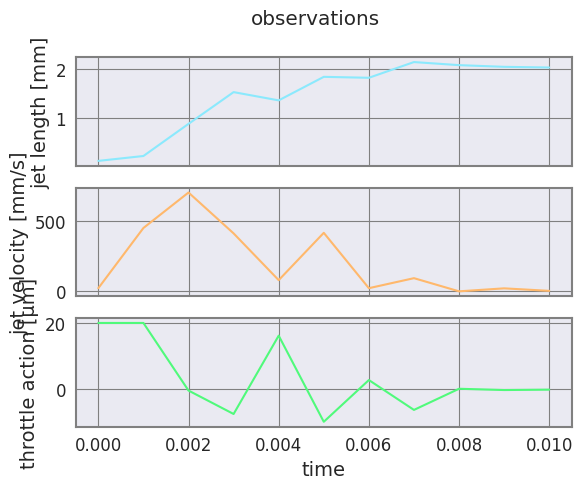

In [25]:
display(callbacks[-1].data)
callbacks[-1].plot(name="observations");

In [26]:
display(callbacks[0].data)

,time,jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm],hydraulic pressure [Pa],working pressure [Pa]
0,0.000000e+00,0.000000,0.000000,1000.00000,0.000000,0.000000,100000.000000,100000.000000
1,1.000000e-07,0.000000,0.000000,1000.00000,0.000000,0.001000,100000.001581,100000.000000
2,2.000000e-07,0.000000,0.000000,1000.00000,0.000000,0.002000,100000.006323,100000.000000
3,3.000000e-07,0.000000,0.000000,1000.00000,0.000000,0.003000,100000.014227,100000.000000
4,4.000000e-07,0.000000,0.000000,1000.00000,0.000000,0.004000,100000.025291,100000.000000
...,...,...,...,...,...,...,...,...
99997,9.999700e-03,2.085548,2.431200,1000.56779,0.661894,-2.207623,107798.421400,100000.000956
99998,9.999800e-03,2.085548,1.986421,1000.56779,0.540803,-2.207637,107798.365492,100000.003428
99999,9.999900e-03,2.085548,1.541336,1000.56779,0.419629,-2.207650,107798.310262,100000.003756
100000,1.000000e-02,2.085548,1.095944,1000.56779,0.298371,-2.207664,107798.255726,100000.003018


## Display data and animation

In [27]:
state_trajectory = callbacks[0].data
observations = callbacks[-1].data
display(observations)
# callbacks[-1].plot(name="observations"); # Replace plot to own plot function!

# Clean callback
callbacks[0].reset()
callbacks[-1].clear_recent_data()

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.179971,0.003180,1,1,20.000000,0.143056,20.581434,1000.038947,5.603295,0.373554
1,0.001000,2.837861,0.006018,1,1,20.000000,0.241708,447.744584,1000.065805,121.898463,8.134423
2,0.002000,1.071521,0.007089,1,1,-0.540905,0.891160,699.599881,1000.242618,190.466068,12.727747
3,0.003000,0.154756,0.007244,1,1,-7.668140,1.532913,409.486457,1000.417335,111.482688,7.438191
4,0.004000,0.314169,0.007558,1,1,16.139487,1.365795,77.623769,1000.371838,21.133071,1.408915
5,0.005000,0.007169,0.007565,1,1,-10.034812,1.841633,413.498101,1000.501385,112.574858,7.511181
6,0.006000,0.010775,0.007576,1,1,2.649787,1.822500,20.539201,1000.496176,5.591798,0.372788
7,0.007000,0.045773,0.007622,1,1,-6.427477,2.140250,91.620094,1000.582683,24.943571,1.662975
8,0.008000,0.022987,0.007645,1,1,-0.000600,2.077917,-1.815821,1000.565713,-0.494357,-0.030837
9,0.009000,0.013833,0.007659,1,1,-0.388463,2.043918,19.368173,1000.556457,5.272985,0.351534


In [28]:
l_crit = system._parameters["l_crit"]
D_drop = system._parameters["D_drop"]
D_exit = system._parameters["D_exit"]*1e3
D_drop_rel = D_drop/D_exit

anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
anim_cl.animate_system(interacitve=True)

           INFO     Animation.save using <class 'matplotlib.animation.HTMLWriter'>                ]8;id=767353;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=133662;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\

Once 
 
 Loop 
 
 Reflect

Save results

In [29]:
anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
# save animation
anim_cl.animate_system(save_gif=True, gif_filename = '../results/system_animation_mpc_noize_ru.gif')
# save last frame
anim_cl.save_last_frame('../results/system_last_observation_mpc_noize_ru.pdf')

[01:26:48] INFO     Animation.save using <class 'matplotlib.animation.PillowWriter'>              ]8;id=983125;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=555958;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\